In [1]:
import pandas as pd 

In [2]:
%store -r lst

In [3]:

listings = lst[['id', 'listing_url']]


In [4]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8898 entries, 0 to 13944
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           8898 non-null   int64 
 1   listing_url  8898 non-null   object
dtypes: int64(1), object(1)
memory usage: 208.5+ KB


Obtaining all the images we can get 


In [5]:
import os
import requests
import re
import json
from concurrent.futures import ThreadPoolExecutor
import time

def extract_listing_id(url):
    match = re.search(r'/rooms/(\d+)', url)
    return match.group(1) if match else None

def download_image(url, filepath):
    try:
        headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36'}
        response = requests.get(url, headers=headers, stream=True, timeout=10)
        response.raise_for_status()
        with open(filepath, 'wb') as f:
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
        return True
    except:
        return False

def get_airbnb_photos(listing_id):
    """Get photos directly from Airbnb's API"""
    try:
        headers = {
            'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36',
            'Accept': 'application/json, text/plain, */*',
            'Accept-Language': 'en-US,en;q=0.9',
        }
        
        # Try different API endpoints
        api_urls = [
            f"https://www.airbnb.com/api/v3/PdpPlatformSections/{listing_id}",
            f"https://www.airbnb.com/api/v2/homes_pdp_reviews/{listing_id}",
            f"https://www.airbnb.com/rooms/{listing_id}"
        ]
        
        photo_urls = []
        
        for api_url in api_urls:
            try:
                response = requests.get(api_url, headers=headers, timeout=15)
                if response.status_code == 200:
                    content = response.text
                    
                    # Extract image URLs using regex patterns
                    patterns = [
                        r'"picture":"([^"]*muscache\.com[^"]*)"',
                        r'"url":"([^"]*muscache\.com[^"]*)"',
                        r'"large":"([^"]*muscache\.com[^"]*)"',
                        r'"xl_picture":"([^"]*muscache\.com[^"]*)"',
                        r'https://[^"]*muscache\.com/[^"]*'
                    ]
                    
                    for pattern in patterns:
                        matches = re.findall(pattern, content)
                        for match in matches:
                            if 'muscache.com' in match and len(match) > 50:
                                # Clean URL and make high quality
                                clean_url = match.replace('\\u002F', '/').replace('\\', '')
                                if '?' in clean_url:
                                    base_url = clean_url.split('?')[0]
                                    clean_url = f"{base_url}?w=1440"
                                photo_urls.append(clean_url)
                
                if photo_urls:
                    break
                    
            except:
                continue
        
        # Remove duplicates
        return list(dict.fromkeys(photo_urls))
        
    except:
        return []

def scrape_listing_photos_fast(listing_url):
    listing_id = extract_listing_id(listing_url)
    if not listing_id:
        return False
    
    # Create folder
    folder_path = os.path.join("images", listing_id)
    os.makedirs(folder_path, exist_ok=True)
    
    # Get photos from API
    photo_urls = get_airbnb_photos(listing_id)
    
    if not photo_urls:
        return False
    
    # Download images in parallel
    successful = 0
    def download_single(args):
        i, url = args
        filepath = os.path.join(folder_path, f"image_{i}.jpg")
        return download_image(url, filepath)
    
    with ThreadPoolExecutor(max_workers=5) as executor:
        results = list(executor.map(download_single, enumerate(photo_urls, 1)))
        successful = sum(results)
    
    return successful > 0


total_listings = len(listings) 
successful_count = 0

for i in range(total_listings):
    url = listings.iloc[i]['listing_url']
    percentage = ((i + 1) / total_listings) * 100
    print(f"Processing {percentage:.0f}% ({i+1}/{total_listings}) listings")
    
    if scrape_listing_photos_fast(url):
        successful_count += 1

print(f"\nCompleted: {successful_count}/{total_listings} listings processed successfully")

Processing 0% (1/8898) listings
Processing 0% (2/8898) listings
Processing 0% (3/8898) listings
Processing 0% (4/8898) listings
Processing 0% (5/8898) listings
Processing 0% (6/8898) listings
Processing 0% (7/8898) listings
Processing 0% (8/8898) listings
Processing 0% (9/8898) listings
Processing 0% (10/8898) listings
Processing 0% (11/8898) listings
Processing 0% (12/8898) listings
Processing 0% (13/8898) listings
Processing 0% (14/8898) listings
Processing 0% (15/8898) listings
Processing 0% (16/8898) listings
Processing 0% (17/8898) listings
Processing 0% (18/8898) listings
Processing 0% (19/8898) listings
Processing 0% (20/8898) listings
Processing 0% (21/8898) listings
Processing 0% (22/8898) listings
Processing 0% (23/8898) listings
Processing 0% (24/8898) listings
Processing 0% (25/8898) listings
Processing 0% (26/8898) listings
Processing 0% (27/8898) listings
Processing 0% (28/8898) listings
Processing 0% (29/8898) listings
Processing 0% (30/8898) listings
Processing 0% (31/8

Throw the junk out 


In [ ]:
import os
from PIL import Image
import time
from concurrent.futures import ThreadPoolExecutor, as_completed
import threading

# Thread-safe counters
class SafeCounter:
    def __init__(self):
        self._value = 0
        self._lock = threading.Lock()
    
    def increment(self):
        with self._lock:
            self._value += 1
    
    @property
    def value(self):
        return self._value

def can_open_image_fast(filepath):
    """Optimized image checking - single open, minimal processing"""
    try:
        with Image.open(filepath) as img:
            # Get basic info without loading full image
            width, height = img.size
            format = img.format
            
            # Quick size filter
            if width < 200 or height < 200:
                return False, f"Too small ({width}x{height})"
            
            # Load a small sample of the image for analysis
            # Resize to max 100x100 for fast processing
            max_size = 100
            if width > max_size or height > max_size:
                img.thumbnail((max_size, max_size), Image.Resampling.LANCZOS)
            
            # Convert to RGB for analysis
            if img.mode != 'RGB':
                img = img.convert('RGB')
            
            # Fast junk detection on small image
            if is_likely_junk_fast(img):
                return False, f"Likely junk/icon ({width}x{height})"
            
            # If we got here, verify the image is actually readable
            img.load()  # This will raise an exception if corrupted
            
        return True, "Valid image"
        
    except Exception as e:
        return False, f"Cannot open: {str(e)}"

def is_likely_junk_fast(img):
    """Fast junk detection using small thumbnail"""
    try:
        pixels = list(img.getdata())
        total_pixels = len(pixels)
        
        if total_pixels == 0:
            return True
        
        # Sample fewer pixels for speed (every 5th pixel)
        sample_step = max(1, total_pixels // 200)  # Max 200 samples
        sampled_pixels = pixels[::sample_step]
        
        # Count unique colors
        unique_colors = len(set(sampled_pixels))
        color_diversity = unique_colors / len(sampled_pixels)
        
        # If very few colors, likely an icon/graphic
        if color_diversity < 0.1:  # Less than 10% unique colors
            return True
        
        # Check for dominant color (typical of logos/icons)
        color_counts = {}
        for pixel in sampled_pixels:
            color_counts[pixel] = color_counts.get(pixel, 0) + 1
        
        if color_counts:
            max_count = max(color_counts.values())
            dominance = max_count / len(sampled_pixels)
            
            # If one color dominates >60%, likely junk
            if dominance > 0.6:
                return True
        
        # Check for Airbnb brand colors (red/pink)
        brand_pixels = sum(1 for r, g, b in sampled_pixels 
                          if (r > 200 and g < 120 and b < 120) or
                             (r > 220 and 50 < g < 150 and 50 < b < 150))
        
        if len(sampled_pixels) > 0 and (brand_pixels / len(sampled_pixels)) > 0.3:
            return True
            
        return False
        
    except:
        return True  # If analysis fails, assume it's junk

def process_single_image(args):
    """Process a single image - for thread pool"""
    filepath, filename = args
    can_open, reason = can_open_image_fast(filepath)
    return filepath, filename, can_open, reason

def process_listing_folder_parallel(listing_path, listing_folder, max_workers=4):
    """Process a single listing folder with parallel processing"""
    
    # Get all image files
    try:
        all_files = os.listdir(listing_path)
    except OSError:
        return 0, 0, 0
        
    image_files = [f for f in all_files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
    
    if not image_files:
        return 0, 0, 0
    
    print(f"  📷 Found {len(image_files)} image files")
    
    folder_total = len(image_files)
    folder_working = 0
    folder_broken = 0
    
    # Prepare arguments for parallel processing
    image_args = [(os.path.join(listing_path, filename), filename) for filename in image_files]
    
    # Process images in parallel
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        # Submit all tasks
        future_to_image = {executor.submit(process_single_image, args): args for args in image_args}
        
        # Process results as they complete
        for future in as_completed(future_to_image):
            filepath, filename, can_open, reason = future.result()
            
            if can_open:
                folder_working += 1
                print(f"  ✅ {filename}")
            else:
                folder_broken += 1
                print(f"  ❌ {filename} - {reason}")
                
                # Remove broken files
                try:
                    os.remove(filepath)
                    print(f"     🗑️ Deleted")
                except Exception as e:
                    print(f"     ⚠️ Could not delete: {e}")
    
    return folder_total, folder_working, folder_broken

def remove_broken_images_fast(base_folder="images", max_workers=4):
    """Optimized version with parallel processing"""
    
    if not os.path.exists(base_folder):
        print(f"❌ Folder {base_folder} doesn't exist!")
        return
    
    start_time = time.time()
    
    total_files = 0
    working_files = 0
    broken_files = 0
    folders_processed = 0
    
    print(f"🚀 Fast cleanup - removing broken images from {base_folder}/")
    print(f"⚡ Using {max_workers} parallel workers per folder")
    print("=" * 60)
    
    # Get all folders and sort numerically
    try:
        all_items = os.listdir(base_folder)
        listing_folders = [item for item in all_items if os.path.isdir(os.path.join(base_folder, item))]
        
        try:
            listing_folders.sort(key=lambda x: int(x))
        except ValueError:
            listing_folders.sort()
            
        print(f"📁 Processing {len(listing_folders)} folders")
        
        # Process each folder
        for listing_folder in listing_folders:
            listing_path = os.path.join(base_folder, listing_folder)
            folders_processed += 1
            
            folder_start = time.time()
            print(f"\n📁 [{folders_processed}/{len(listing_folders)}] Processing listing {listing_folder}...")
            
            folder_total, folder_working, folder_broken = process_listing_folder_parallel(
                listing_path, listing_folder, max_workers
            )
            
            total_files += folder_total
            working_files += folder_working
            broken_files += folder_broken
            
            folder_time = time.time() - folder_start
            
            if folder_total > 0:
                percentage_working = (folder_working / folder_total) * 100
                rate = folder_total / folder_time if folder_time > 0 else 0
                print(f"  📊 {folder_working}/{folder_total} kept ({percentage_working:.1f}%) - {rate:.1f} files/sec")
            
            # Remove empty folders
            try:
                if not os.listdir(listing_path):
                    os.rmdir(listing_path)
                    print(f"  🗑️ Removed empty folder")
            except:
                pass
                
            # Progress update
            elapsed = time.time() - start_time
            if folders_processed > 0:
                avg_time_per_folder = elapsed / folders_processed
                remaining_folders = len(listing_folders) - folders_processed
                eta_seconds = remaining_folders * avg_time_per_folder
                eta_minutes = eta_seconds / 60
                print(f"  ⏱️ ETA: {eta_minutes:.1f} minutes")
    
    except Exception as e:
        print(f"❌ Error processing folders: {e}")
        return
    
    # Final summary
    total_time = time.time() - start_time
    print("\n" + "=" * 60)
    print(f"🏁 FAST CLEANUP COMPLETE")
    print(f"⏱️ Total time: {total_time/60:.1f} minutes")
    print(f"📁 Folders processed: {folders_processed}")
    print(f"📄 Total files checked: {total_files}")
    print(f"✅ Working images kept: {working_files}")
    print(f"❌ Broken images removed: {broken_files}")
    
    if total_files > 0:
        percentage_working = (working_files / total_files) * 100
        rate = total_files / total_time if total_time > 0 else 0
        print(f"📊 Success rate: {percentage_working:.1f}%")
        print(f"⚡ Processing rate: {rate:.1f} files/sec")
    
    return working_files, broken_files

def quick_stats(base_folder="images"):
    """Quick folder statistics without opening images"""
    if not os.path.exists(base_folder):
        print(f"❌ Folder {base_folder} doesn't exist!")
        return
    
    print(f"📊 Quick Stats for {base_folder}/")
    print("-" * 40)
    
    total_listings = 0
    total_photos = 0
    
    for item in os.listdir(base_folder):
        item_path = os.path.join(base_folder, item)
        if os.path.isdir(item_path):
            total_listings += 1
            try:
                photo_count = len([f for f in os.listdir(item_path) 
                                 if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))])
                total_photos += photo_count
            except:
                pass
    
    print(f"📁 Total listings: {total_listings}")
    print(f"🖼️ Total photos: {total_photos}")
    if total_listings > 0:
        print(f"📈 Average: {total_photos/total_listings:.1f} photos/listing")


if __name__ == "__main__":
    print("🚀 Starting FAST image cleanup...")
    
    
    quick_stats()
    print()
    

    remove_broken_images_fast(max_workers=6)
    
    print("\n📊 Final stats:")
    quick_stats()

🔧 Starting cleanup - removing ONLY broken images...
🔧 Removing only broken images from images/
📁 Processing 8898 folders: ['3176', '9991', '14325', '16644', '17904', '21869', '22677', '28156', '30295', '34854', '37004', '37836', '42809', '55853', '62613', '64014', '64245', '64590', '68448', '69780', '72079', '80843', '81081', '83614', '85560', '86090', '89102', '115576', '117649', '127708', '147339', '151249', '159454', '163411', '168615', '173153', '176342', '176355', '179102', '180440', '181160', '186851', '189288', '190448', '192499', '194374', '194465', '198584', '205296', '206021', '214518', '220445', '221015', '222784', '229099', '229348', '229363', '229776', '230611', '231220', '233083', '237670', '238396', '242794', '242908', '242927', '242978', '243057', '243063', '243081', '243238', '245744', '245827', '249419', '250007', '250253', '250687', '250704', '250707', '250729', '250753', '251398', '251406', '251423', '251486', '251493', '252664', '254788', '255557', '255722', '25582

C:\Users\dimit\AppData\Roaming\Python\Python313\site-packages\PIL\TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))
C:\Users\dimit\AppData\Roaming\Python\Python313\site-packages\PIL\JpegImagePlugin.py:890: UserWarning: Image appears to be a malformed MPO file, it will be interpreted as a base JPEG file
  warnings.warn(


  ❌ image_80.jpg - Icon/simple graphic (4000x3000)
     🗑️ Deleted broken file image_80.jpg
  ✅ image_81.jpg - Valid image
  ❌ image_9.jpg - Cannot open: cannot identify image file 'images\\12839362\\image_9.jpg'
     🗑️ Deleted broken file image_9.jpg
  📊 Listing 12839362: 10/79 working (12.7%)

📁 Processing listing 12843786 (990/8898)...
  📷 Found 91 image files
  ❌ image_1.jpg - Cannot open: cannot identify image file 'images\\12843786\\image_1.jpg'
     🗑️ Deleted broken file image_1.jpg
  ❌ image_10.jpg - Cannot open: cannot identify image file 'images\\12843786\\image_10.jpg'
     🗑️ Deleted broken file image_10.jpg
  ❌ image_11.jpg - Cannot open: cannot identify image file 'images\\12843786\\image_11.jpg'
     🗑️ Deleted broken file image_11.jpg
  ❌ image_12.jpg - Cannot open: cannot identify image file 'images\\12843786\\image_12.jpg'
     🗑️ Deleted broken file image_12.jpg
  ❌ image_13.jpg - Cannot open: cannot identify image file 'images\\12843786\\image_13.jpg'
     🗑️ Dele

KeyboardInterrupt: 

In [7]:
import zipfile
import os

# Maximum compression for large files
with zipfile.ZipFile('data/external/airbnb_images.zip', 'w', zipfile.ZIP_DEFLATED, compresslevel=9) as zipf:
    for root, dirs, files in os.walk('images'):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.relpath(file_path, 'images'))

print("Done with max compression!")

Done with max compression!


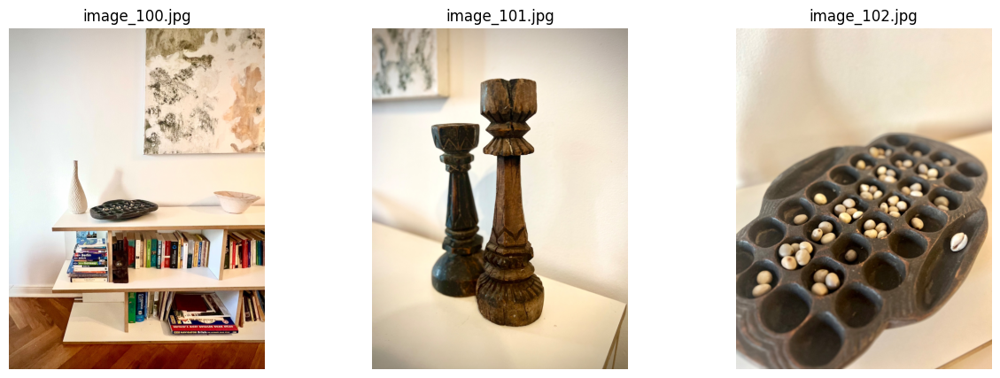

In [9]:
import zipfile
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO

# Open ZIP file and get 3 photos from listing 3176
with zipfile.ZipFile('data/external/airbnb_images.zip', 'r') as zip_ref:
    # Get all files in listing 3176
    listing_files = [f for f in zip_ref.namelist() if f.startswith('3176/')][:3]
    
    # Show them
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    for i, file_path in enumerate(listing_files):
        # Read image data from ZIP
        image_data = zip_ref.read(file_path)
        img = Image.open(BytesIO(image_data))
        
        axes[i].imshow(img)
        axes[i].set_title(file_path.split('/')[-1])  # Just filename
        axes[i].axis('off')
    
    plt.show()